In [1]:
# @title Path Setup and Imports { display-mode: "form" }
# @markdown (double click to show code).

%cd ../

/coc/pskynet3/hagrawal9/project/habitat/habitat-api


In [ ]:
import sys
# sys.path = sys.path[1:]

In [ ]:
sys.path

In [4]:
## [setup]
import gzip
import json
import os
import sys
from typing import Any, Dict, List, Optional, Type

import attr
import cv2
import git
import magnum as mn
import numpy as np

%matplotlib inline
from matplotlib import pyplot as plt
from PIL import Image

import habitat
import habitat_sim
from habitat.config import Config
from habitat.core.registry import registry
from habitat_sim.utils import viz_utils as vut
from habitat_sim.utils.common import *

if "google.colab" in sys.modules:
    os.environ["IMAGEIO_FFMPEG_EXE"] = "/usr/bin/ffmpeg"

repo = git.Repo(".", search_parent_directories=True)
dir_path = repo.working_tree_dir
%cd $dir_path
data_path = os.path.join(dir_path, "data")
output_directory = "data/tutorials/output/"  # @param {type:"string"}
output_path = os.path.join(dir_path, output_directory)

if __name__ == "__main__":
    import argparse

    parser = argparse.ArgumentParser()
    parser.add_argument("--no-display", dest="display", action="store_false")
    parser.add_argument(
        "--no-make-video", dest="make_video", action="store_false"
    )
    parser.set_defaults(show_video=True, make_video=True)
    args, _ = parser.parse_known_args()
    show_video = args.display
    display = args.display
    make_video = args.make_video
else:
    show_video = False
    make_video = False
    display = False

if make_video and not os.path.exists(output_path):
    os.makedirs(output_path)

/coc/pskynet3/hagrawal9/project/habitat/habitat-api


In [5]:
# @title Util functions to visualize observations
# @markdown - `make_video_cv2`: Renders a video from a list of observations
# @markdown - `simulate`: Runs simulation for a given amount of time at 60Hz
# @markdown - `simulate_and_make_vid` Runs simulation and creates video


def make_video_cv2(
    observations, cross_hair=None, prefix="", open_vid=True, fps=60
):
    sensor_keys = list(observations[0])
    videodims = observations[0][sensor_keys[0]].shape
    videodims = (videodims[1], videodims[0])  # flip to w,h order
    print(videodims)
    video_file = output_path + prefix + ".mp4"
    print("Encoding the video: %s " % video_file)
    writer = vut.get_fast_video_writer(video_file, fps=fps)
    for ob in observations:
        # If in RGB/RGBA format, remove the alpha channel
        rgb_im_1st_person = cv2.cvtColor(ob["rgb"], cv2.COLOR_RGBA2RGB)
        if cross_hair is not None:
            rgb_im_1st_person[
                cross_hair[0] - 2 : cross_hair[0] + 2,
                cross_hair[1] - 2 : cross_hair[1] + 2,
            ] = [255, 0, 0]

        if rgb_im_1st_person.shape[:2] != videodims:
            rgb_im_1st_person = cv2.resize(
                rgb_im_1st_person, videodims, interpolation=cv2.INTER_AREA
            )
        # write the 1st person observation to video
        writer.append_data(rgb_im_1st_person)
    writer.close()

    if open_vid:
        print("Displaying video")
        vut.display_video(video_file)


def simulate(sim, dt=1.0, get_frames=True):
    # simulate dt seconds at 60Hz to the nearest fixed timestep
    print("Simulating " + str(dt) + " world seconds.")
    observations = []
    start_time = sim.get_world_time()
    while sim.get_world_time() < start_time + dt:
        sim.step_physics(1.0 / 60.0)
        if get_frames:
            observations.append(sim.get_sensor_observations())
    return observations


# convenience wrapper for simulate and make_video_cv2
def simulate_and_make_vid(sim, crosshair, prefix, dt=1.0, open_vid=True):
    observations = simulate(sim, dt)
    make_video_cv2(observations, crosshair, prefix=prefix, open_vid=open_vid)


def display_sample(
    rgb_obs, semantic_obs=np.array([]), depth_obs=np.array([]), key_points=None
):
    from habitat_sim.utils.common import d3_40_colors_rgb

    rgb_img = Image.fromarray(rgb_obs, mode="RGBA")

    arr = [rgb_img]
    titles = ["rgb"]
    if semantic_obs.size != 0:
        semantic_img = Image.new(
            "P", (semantic_obs.shape[1], semantic_obs.shape[0])
        )
        semantic_img.putpalette(d3_40_colors_rgb.flatten())
        semantic_img.putdata((semantic_obs.flatten() % 40).astype(np.uint8))
        semantic_img = semantic_img.convert("RGBA")
        arr.append(semantic_img)
        titles.append("semantic")

    if depth_obs.size != 0:
        depth_img = Image.fromarray(
            (depth_obs / 10 * 255).astype(np.uint8), mode="L"
        )
        arr.append(depth_img)
        titles.append("depth")

    plt.figure(figsize=(24, 16))
    for i, data in enumerate(arr):
        ax = plt.subplot(1, 3, i + 1)
        ax.axis("off")
        ax.set_title(titles[i])
        # plot points on images
        if key_points is not None and i==0:
            for pix, point in enumerate(key_points):
                plt.plot(
                    point[0], point[1], marker="o", markersize=10, alpha=0.8
                )
        plt.imshow(data)
    plt.tight_layout()
    plt.savefig('vis.png')
    plt.show(block=False)

## 1. Setup the Simulator

---



In [6]:
# @title Setup simulator configuration
# @markdown We'll start with setting up simulator with the following configurations
# @markdown - The simulator will render both RGB, Depth observations of 256x256 resolution.
# @markdown - The actions available will be `move_forward`, `turn_left`, `turn_right`.


def make_cfg(settings):
    sim_cfg = habitat_sim.SimulatorConfiguration()
    sim_cfg.gpu_device_id = 0
    sim_cfg.default_agent_id = settings["default_agent_id"]
    sim_cfg.scene.id = settings["scene"]
    sim_cfg.enable_physics = settings["enable_physics"]
    sim_cfg.physics_config_file = settings["physics_config_file"]

    # Note: all sensors must have the same resolution
    sensors = {
        "rgb": {
            "sensor_type": habitat_sim.SensorType.COLOR,
            "resolution": [settings["height"], settings["width"]],
            "position": [0.0, settings["sensor_height"], 0.0],
        },
        "depth": {
            "sensor_type": habitat_sim.SensorType.DEPTH,
            "resolution": [settings["height"], settings["width"]],
            "position": [0.0, settings["sensor_height"], 0.0],
        },
    }

    sensor_specs = []
    for sensor_uuid, sensor_params in sensors.items():
        if settings[sensor_uuid]:
            sensor_spec = habitat_sim.SensorSpec()
            sensor_spec.uuid = sensor_uuid
            sensor_spec.sensor_type = sensor_params["sensor_type"]
            sensor_spec.resolution = sensor_params["resolution"]
            sensor_spec.position = sensor_params["position"]

            sensor_specs.append(sensor_spec)

    # Here you can specify the amount of displacement in a forward action and the turn angle
    agent_cfg = habitat_sim.agent.AgentConfiguration()
    agent_cfg.sensor_specifications = sensor_specs
    agent_cfg.action_space = {
        "move_forward": habitat_sim.agent.ActionSpec(
            "move_forward", habitat_sim.agent.ActuationSpec(amount=0.1)
        ),
        "turn_left": habitat_sim.agent.ActionSpec(
            "turn_left", habitat_sim.agent.ActuationSpec(amount=10.0)
        ),
        "turn_right": habitat_sim.agent.ActionSpec(
            "turn_right", habitat_sim.agent.ActuationSpec(amount=10.0)
        ),
    }

    return habitat_sim.Configuration(sim_cfg, [agent_cfg])
        
settings = {
    "max_frames": 10,
    "width": 640,
    "height": 480,
    "hfov": 79,
    "scene": "data/scene_datasets/gibson_train_val/Barboursville.glb",
    "default_agent_id": 0,
    "sensor_height": 0.88,  # Height of sensors in meters
    "rgb": True,  # RGB sensor
    "depth": True,  # Depth sensor
    "seed": 1,
    "enable_physics": True,
    "physics_config_file": "data/default.phys_scene_config.json",
    "silent": False,
    "compute_shortest_path": False,
    "compute_action_shortest_path": False,
    "save_png": True,
}

cfg = make_cfg(settings)

In [7]:
# @title Spawn the agent at a pre-defined location

def init_agent(sim):
    agent_pos = np.array([0.39638743, 0.1543742, 4.1197767])
    
    # Place the agent
    # agent_pos = sim.pathfinder.get_random_navigable_point()
    sim.agents[0].scene_node.translation = agent_pos
    print(agent_pos)
    agent_orientation_y = 0
    sim.agents[0].scene_node.rotation = mn.Quaternion.rotation(
        mn.Deg(agent_orientation_y), mn.Vector3(0, 1.0, 0)
    )

In [8]:
def remove_all_objects(sim):
    for id in sim.get_existing_object_ids():
        sim.remove_object(id)


def set_object_in_front_of_agent(sim, obj_id, z_offset=-1.5, rot_offset=0):
    r"""
    Adds an object in front of the agent at some distance.
    """
    agent_transform = sim.agents[0].scene_node.transformation_matrix()
    T = agent_transform.rotation_y(mn.Deg(rot_offset))
    T.translation = agent_transform.translation

    obj_translation = T.transform_point(
        np.array([0, 0, z_offset])
    )
    sim.set_translation(obj_translation, obj_id)

    obj_node = sim.get_object_scene_node(obj_id)
    xform_bb = habitat_sim.geo.get_transformed_bb(
        obj_node.cumulative_bb, obj_node.transformation
    )

    # also account for collision margin of the scene
    scene_collision_margin = 0.04
    y_translation = mn.Vector3(
        0, xform_bb.size_y() / 2.0 + scene_collision_margin, 0
    )
    sim.set_translation(y_translation + sim.get_translation(obj_id), obj_id)

def init_objects(sim):
    # Manager of Object Attributes Templates
    obj_attr_mgr = sim.get_object_template_manager()

    # Add a chair into the scene.
    obj_path = "data/test_assets/objects/chair.glb"
    chair_template_id = obj_attr_mgr.load_object_configs(
        str(os.path.join(data_path, obj_path))
    )[0]
    chair_attr = obj_attr_mgr.get_template_by_ID(chair_template_id)
    obj_attr_mgr.register_template(chair_attr)

    # Object's initial position 3m away from the agent.
    object_id = sim.add_object_by_handle(chair_attr.handle)
    set_object_in_front_of_agent(sim, object_id, -3.0)
    sim.set_object_motion_type(
        habitat_sim.physics.MotionType.STATIC, object_id
    )

    # Object's final position 7m away from the agent
    goal_id = sim.add_object_by_handle(chair_attr.handle)
    set_object_in_front_of_agent(sim, goal_id, -7.0)
    sim.set_object_motion_type(habitat_sim.physics.MotionType.STATIC, goal_id)

    return object_id, goal_id

In [9]:
DESIRED_DIM = 0.3

def render_object(sim, sel_file_obj_handle, z_offset, rot_offset, remove_object=True):
    if remove_object:
        remove_all_objects(sim)

    obj_handle = os.path.basename(sel_file_obj_handle).split('.')[0]
    object_handle = obj_attr_mgr.get_file_template_handles(obj_handle)[0]

    obj_template = obj_attr_mgr.get_template_by_handle(object_handle)
    obj_template.scale = np.array([1.0, 1.0, 1.0])
    obj_attr_mgr.register_template(obj_template)

    object_id = sim.add_object_by_handle(object_handle)

    rotation_x = mn.Quaternion.rotation(mn.Deg(-90), mn.Vector3(1.0, 0, 0))
    rotation_y = mn.Quaternion.rotation(mn.Deg(90), mn.Vector3(0.0, 1.0, 0))
    rotation_z = mn.Quaternion.rotation(mn.Deg(0), mn.Vector3(0.0, 0, 1.0))
    # rotation_x1 = mn.Quaternion.rotation(mn.Deg(-45), mn.Vector3(1.0, 0, 0))
    orientation = rotation_z * rotation_y * rotation_x

    sim.set_rotation(orientation, object_id)
    set_object_in_front_of_agent(sim, object_id, z_offset, rot_offset)
    
    obj_node = sim.get_object_scene_node(0)
    xform_bb = habitat_sim.geo.get_transformed_bb(
        obj_node.cumulative_bb, obj_node.transformation
    )
    
    max_dim = np.max([xform_bb.size()[0], xform_bb.size()[2]])
    scaling_factor = np.max([1, (DESIRED_DIM / max_dim)])
    sim.remove_object(object_id)
    
    obj_template.scale = np.array([1.0, 1.0, 1.0])*scaling_factor
    
    print(obj_template.scale, scaling_factor, max_dim, DESIRED_DIM)
    obj_attr_mgr.register_template(obj_template)

    
    object_id = sim.add_object_by_handle(object_handle)

    rotation_x = mn.Quaternion.rotation(mn.Deg(-90), mn.Vector3(1.0, 0, 0))
    rotation_y = mn.Quaternion.rotation(mn.Deg(90), mn.Vector3(0.0, 1.0, 0))
    rotation_z = mn.Quaternion.rotation(mn.Deg(0), mn.Vector3(0.0, 0, 1.0))
    # rotation_x1 = mn.Quaternion.rotation(mn.Deg(-45), mn.Vector3(1.0, 0, 0))
    orientation = rotation_z * rotation_y * rotation_x

    sim.set_rotation(orientation, object_id)
    set_object_in_front_of_agent(sim, object_id, z_offset, rot_offset)

    
    sim.set_object_motion_type(habitat_sim.physics.MotionType.STATIC, object_id)
    print(obj_handle, object_id)
    
    if make_video:
        obs = sim.get_sensor_observations()
        print(obs['rgb'].shape)
        display_sample(
            obs['rgb'], semantic_obs=np.array([]), depth_obs=obs['depth'], key_points=[[320, 240]]
        )
    
    return (
        sel_file_obj_handle, {
            'scale': np.array(obj_template.scale).tolist(),
            'orientation': quat_to_coeffs(quat_from_magnum(orientation)).tolist()
        }
    )

I1001 02:53:34.157681 19519 simulator.py:168] Loaded navmesh data/scene_datasets/gibson_train_val/Barboursville.navmesh


[0.39638743 0.1543742  4.1197767 ]
0 data/ycb/002_master_chef_can.phys_properties.json
Vector(2.926, 2.926, 2.926) 2.926000027904511 0.10252904891967773 0.3
002_master_chef_can 0
(480, 640, 4)


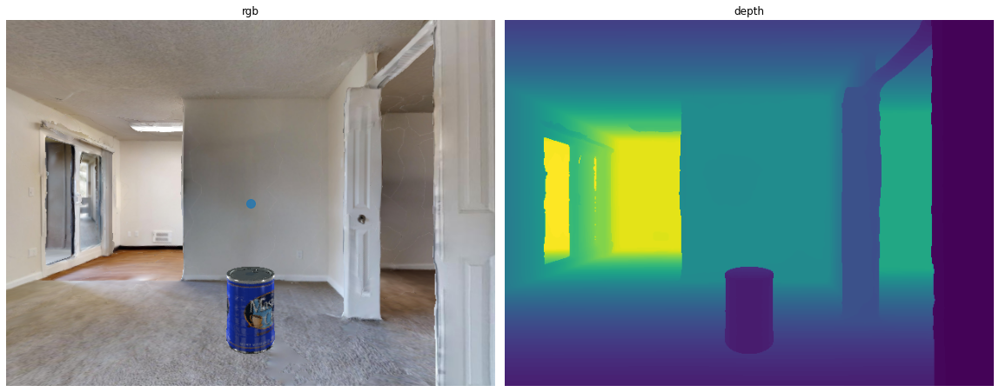

1 data/ycb/003_cracker_box.phys_properties.json
Vector(1.82887, 1.82887, 1.82887) 1.8288664378932498 0.16403603553771973 0.3
003_cracker_box 0
(480, 640, 4)


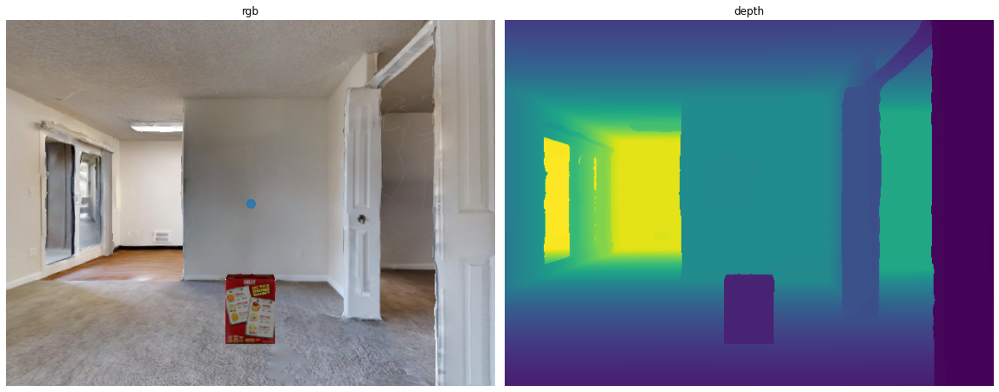

2 data/ycb/004_sugar_box.phys_properties.json
Vector(3.186, 3.186, 3.186) 3.1859990277102574 0.0941619873046875 0.3
004_sugar_box 0
(480, 640, 4)


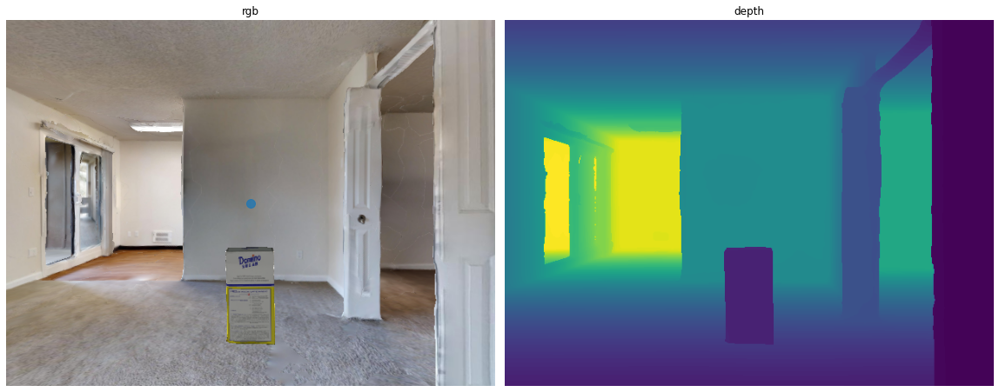

3 data/ycb/005_tomato_soup_can.phys_properties.json
Vector(4.41754, 4.41754, 4.41754) 4.417536862800168 0.06791114807128906 0.3
005_tomato_soup_can 0
(480, 640, 4)


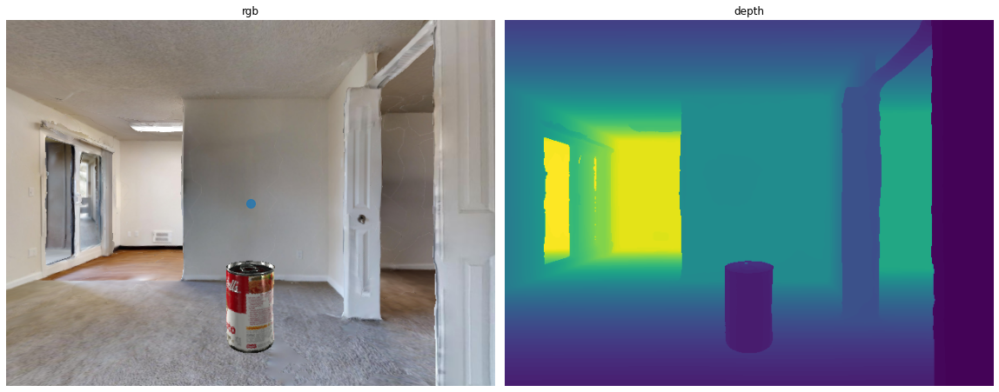

4 data/ycb/006_mustard_bottle.phys_properties.json
Vector(3.08648, 3.08648, 3.08648) 3.0864829595906573 0.0971980094909668 0.3
006_mustard_bottle 0
(480, 640, 4)


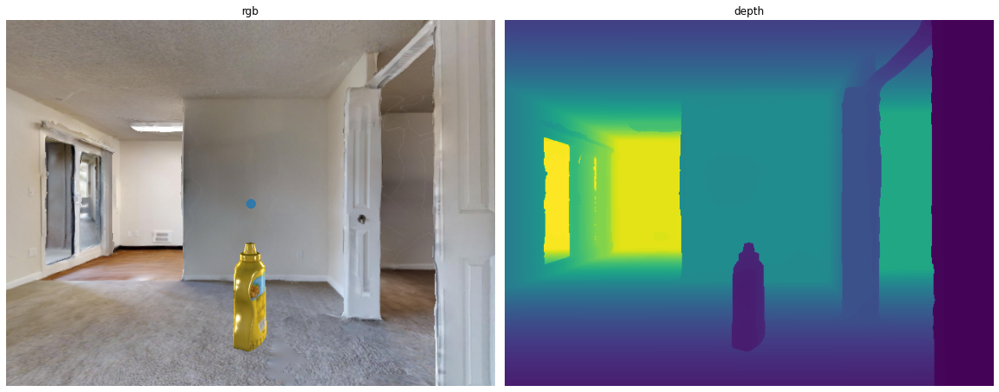

5 data/ycb/007_tuna_fish_can.phys_properties.json
Vector(3.50636, 3.50636, 3.50636) 3.5063567965223204 0.08555889129638672 0.3
007_tuna_fish_can 0
(480, 640, 4)


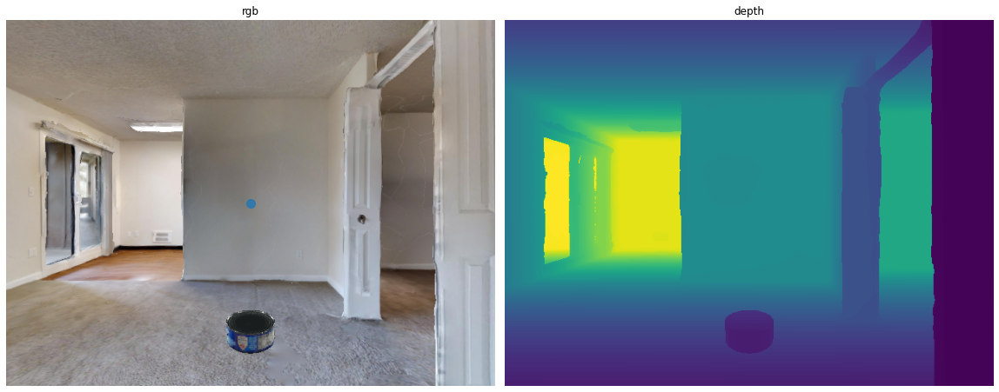

6 data/ycb/008_pudding_box.phys_properties.json
Vector(2.17489, 2.17489, 2.17489) 2.174889811495556 0.1379380226135254 0.3
008_pudding_box 0
(480, 640, 4)


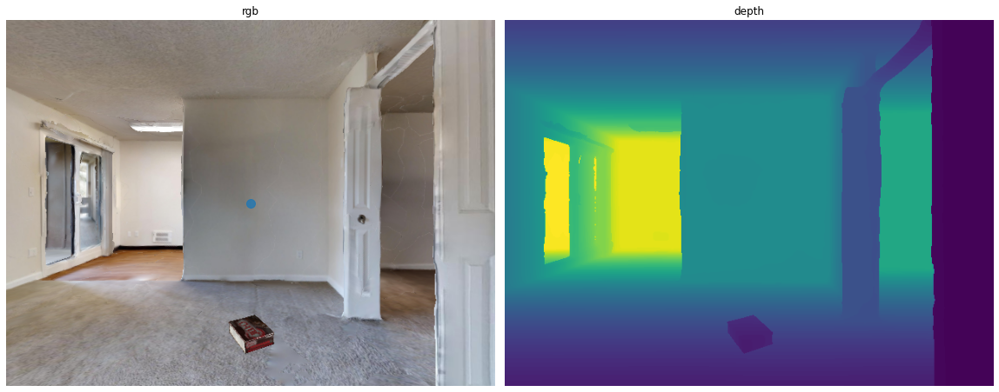

7 data/ycb/009_gelatin_box.phys_properties.json
Vector(2.96713, 2.96713, 2.96713) 2.9671255843566327 0.10110795497894287 0.3
009_gelatin_box 0
(480, 640, 4)


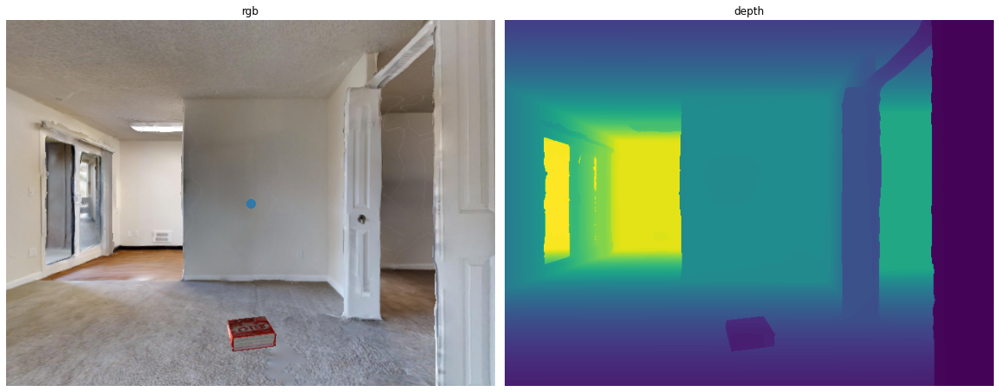

8 data/ycb/010_potted_meat_can.phys_properties.json
Vector(2.93872, 2.93872, 2.93872) 2.9387242629199206 0.10208511352539062 0.3
010_potted_meat_can 0
(480, 640, 4)


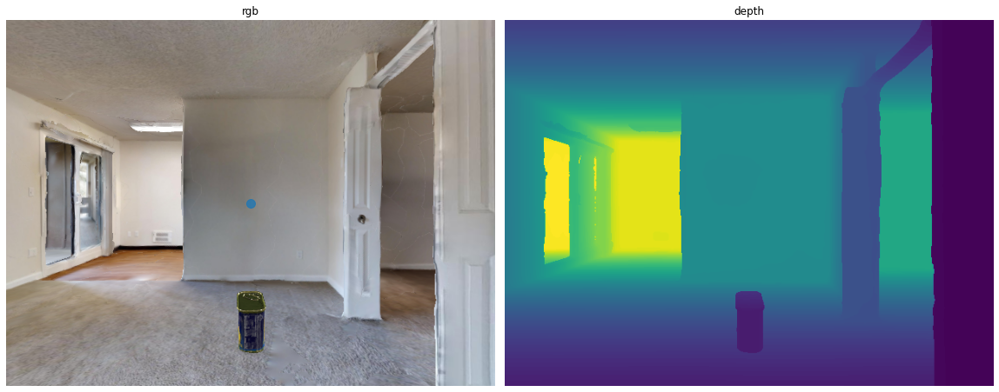

9 data/ycb/012_strawberry.phys_properties.json
Vector(6.62456, 6.62456, 6.62456) 6.624563915801167 0.04528599977493286 0.3
012_strawberry 0
(480, 640, 4)


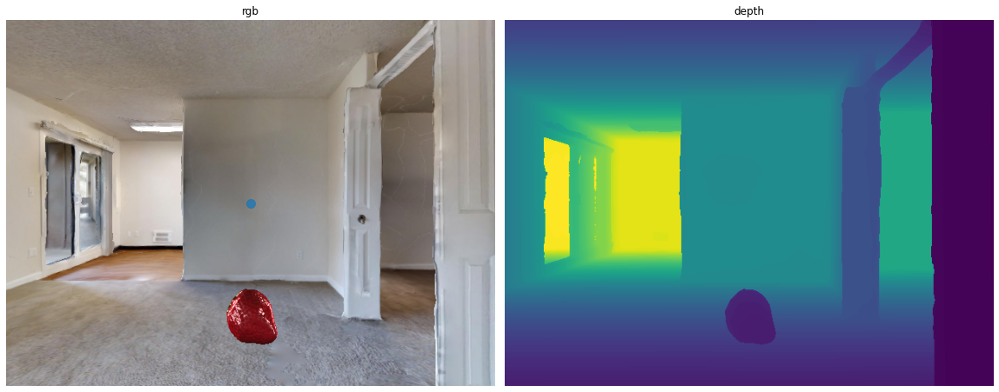

10 data/ycb/013_apple.phys_properties.json
Vector(3.97625, 3.97625, 3.97625) 3.9762466345606917 0.07544803619384766 0.3
013_apple 0
(480, 640, 4)


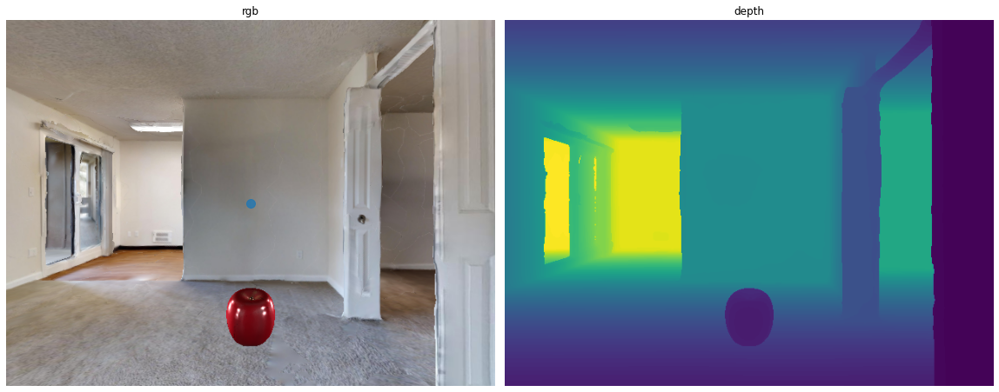

11 data/ycb/014_lemon.phys_properties.json
Vector(4.95149, 4.95149, 4.95149) 4.951485101761345 0.06058788299560547 0.3
014_lemon 0
(480, 640, 4)


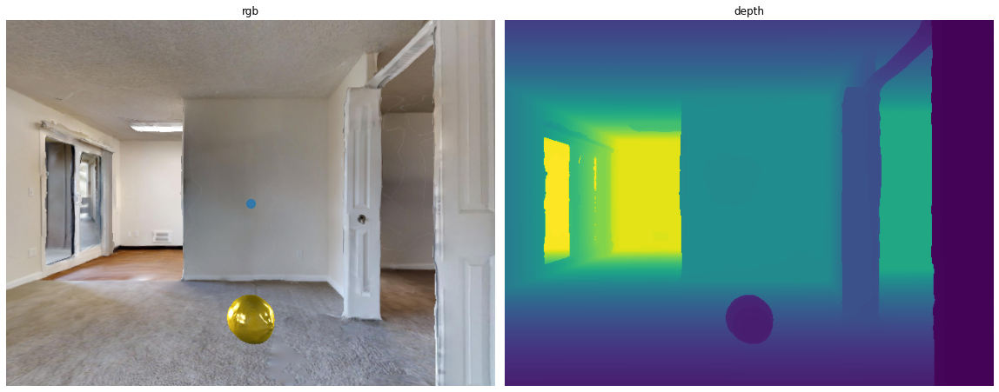

12 data/ycb/015_peach.phys_properties.json
Vector(4.78988, 4.78988, 4.78988) 4.789881908010251 0.06263202428817749 0.3
015_peach 0
(480, 640, 4)


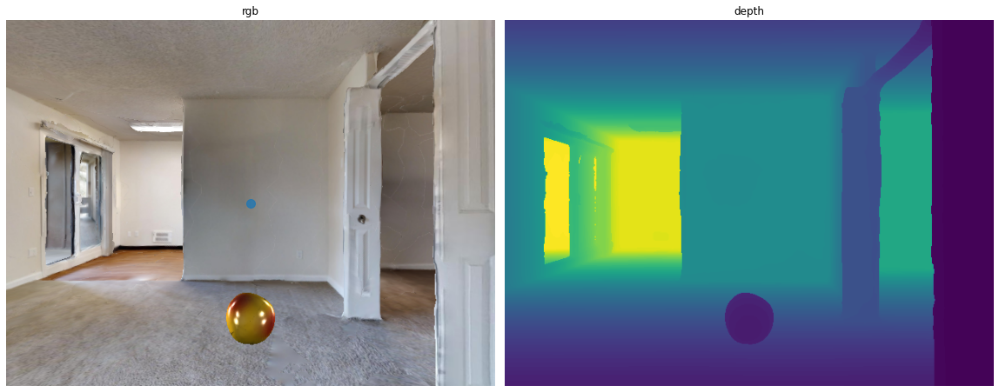

13 data/ycb/016_pear.phys_properties.json
Vector(2.98641, 2.98641, 2.98641) 2.9864122395578376 0.10045498609542847 0.3
016_pear 0
(480, 640, 4)


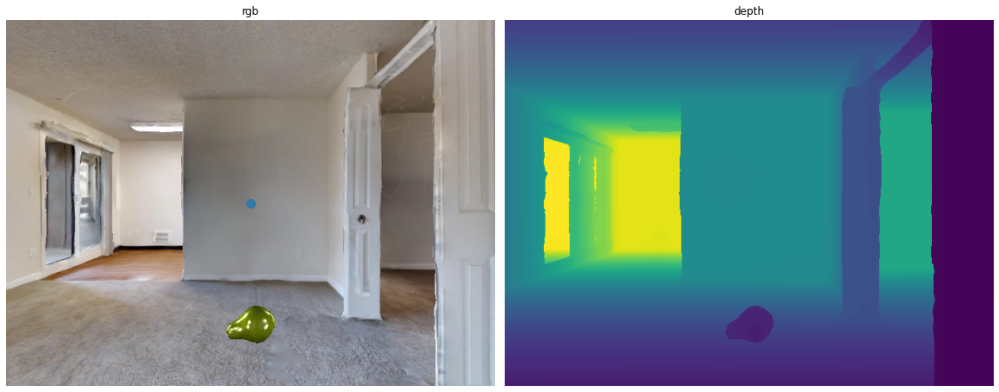

14 data/ycb/017_orange.phys_properties.json
Vector(4.05482, 4.05482, 4.05482) 4.05482151877217 0.0739859938621521 0.3
017_orange 0
(480, 640, 4)


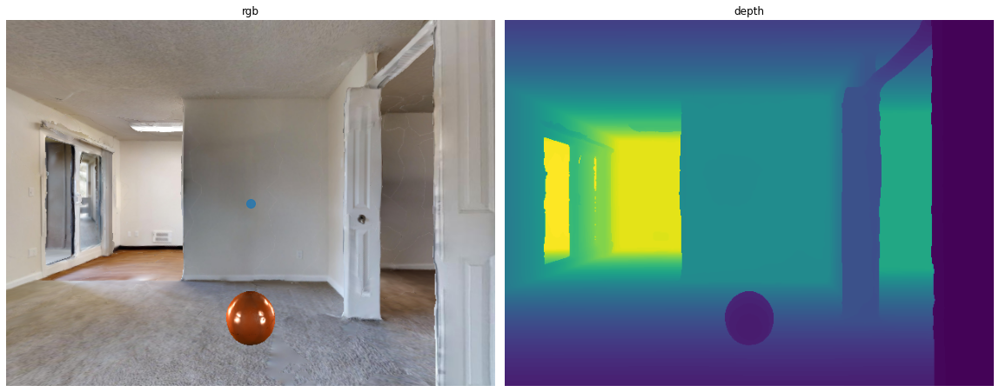

15 data/ycb/018_plum.phys_properties.json
Vector(5.24568, 5.24568, 5.24568) 5.245677694770544 0.05718994140625 0.3
018_plum 0
(480, 640, 4)


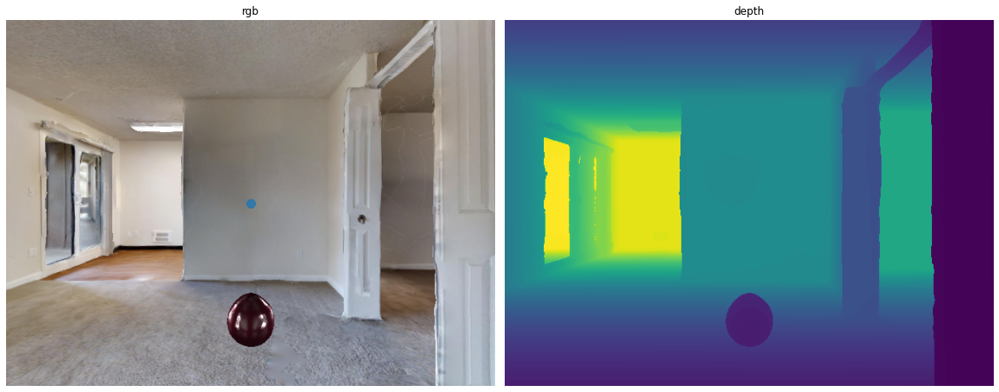

16 data/ycb/019_pitcher_base.phys_properties.json
Vector(2.01161, 2.01161, 2.01161) 2.011611570644302 0.14913415908813477 0.3
019_pitcher_base 0
(480, 640, 4)


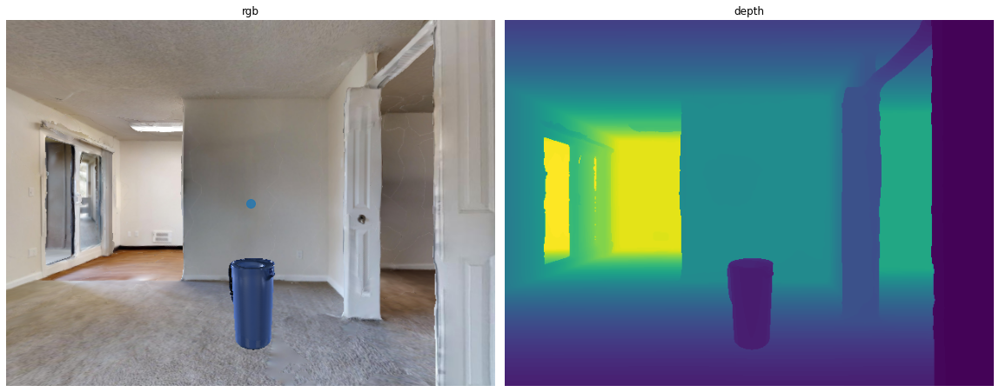

17 data/ycb/024_bowl.phys_properties.json
Vector(1.85801, 1.85801, 1.85801) 1.8580133013596682 0.16146278381347656 0.3
024_bowl 0
(480, 640, 4)


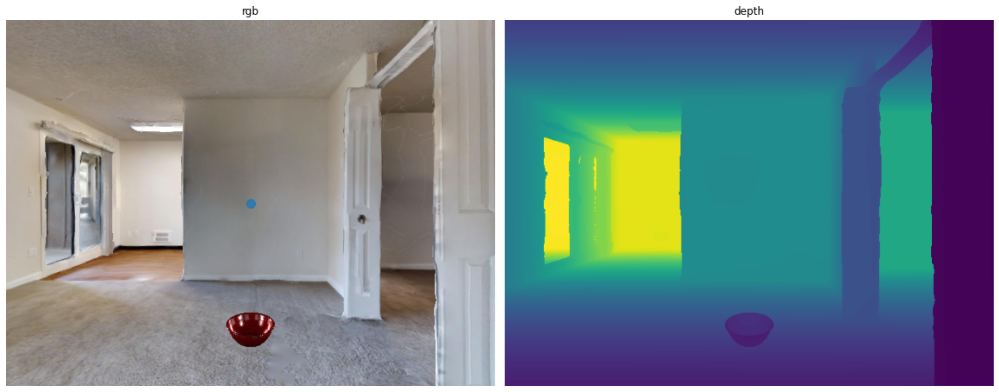

18 data/ycb/025_mug.phys_properties.json
Vector(2.56446, 2.56446, 2.56446) 2.5644556582277964 0.11698389053344727 0.3
025_mug 0
(480, 640, 4)


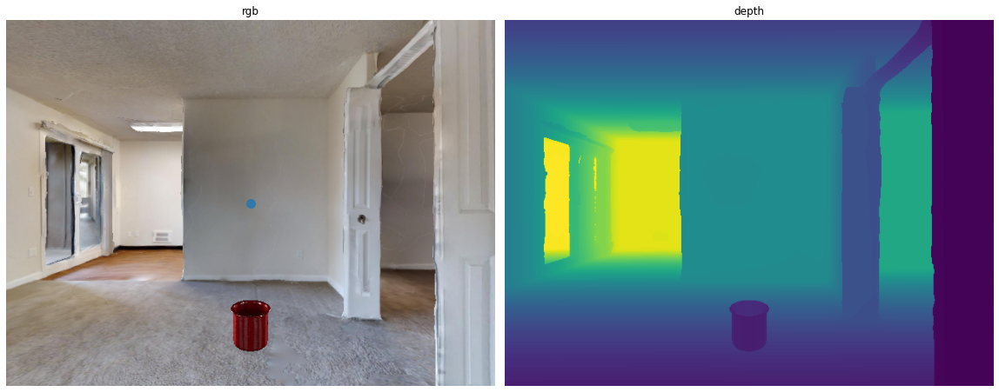

19 data/ycb/036_wood_block.phys_properties.json
Vector(2.88692, 2.88692, 2.88692) 2.886915982196118 0.10391712188720703 0.3
036_wood_block 0
(480, 640, 4)


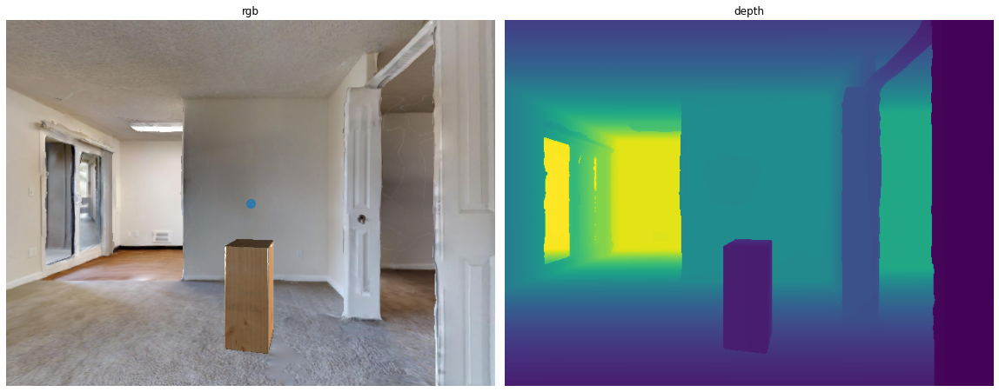

20 data/ycb/053_mini_soccer_ball.phys_properties.json
Vector(2.34271, 2.34271, 2.34271) 2.342706708123103 0.12805700302124023 0.3
053_mini_soccer_ball 0
(480, 640, 4)


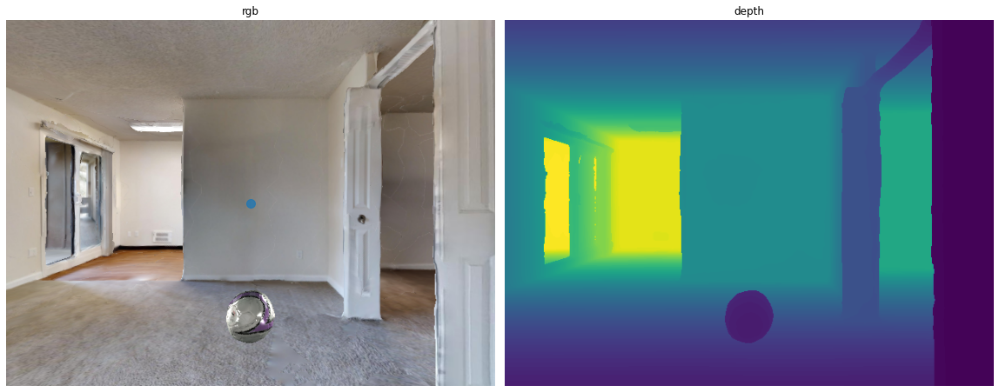

21 data/ycb/054_softball.phys_properties.json
Vector(3.11935, 3.11935, 3.11935) 3.1193461301046397 0.09617400169372559 0.3
054_softball 0
(480, 640, 4)


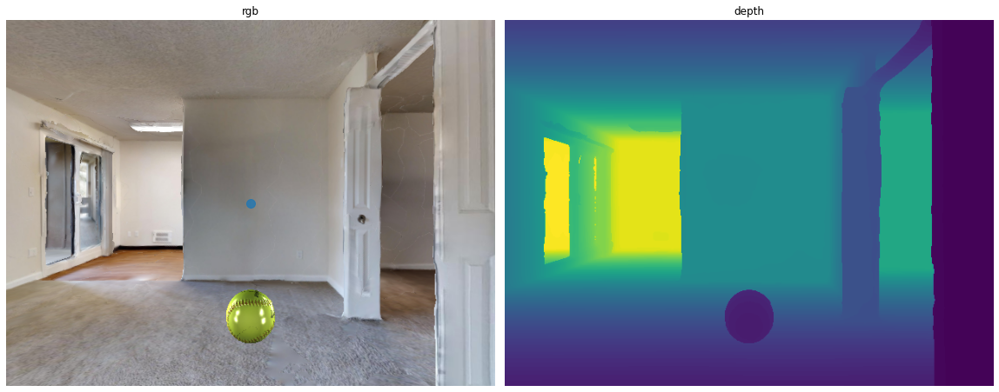

22 data/ycb/055_baseball.phys_properties.json
Vector(4.06989, 4.06989, 4.06989) 4.069894119911181 0.07371199131011963 0.3
055_baseball 0
(480, 640, 4)


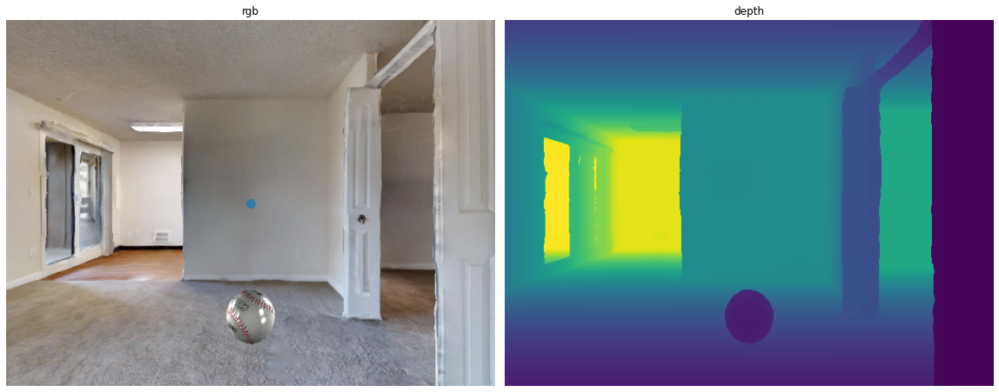

23 data/ycb/056_tennis_ball.phys_properties.json
Vector(4.47561, 4.47561, 4.47561) 4.475607094934362 0.06703001260757446 0.3
056_tennis_ball 0
(480, 640, 4)


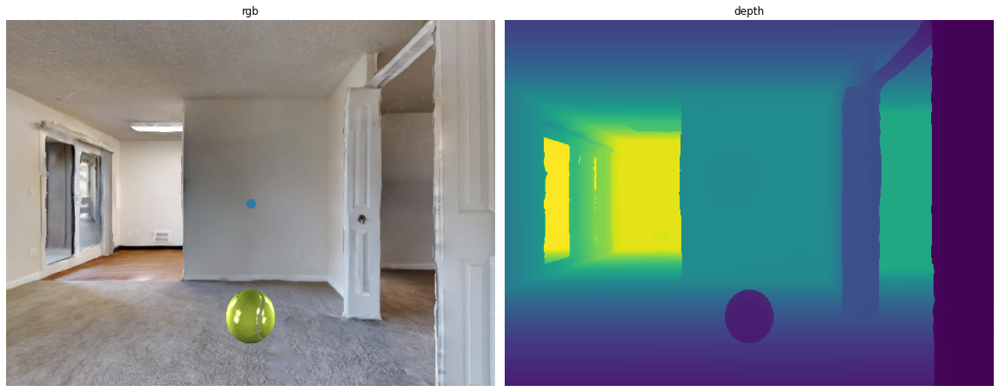

24 data/ycb/057_racquetball.phys_properties.json
Vector(5.35179, 5.35179, 5.35179) 5.351794594790013 0.05605596303939819 0.3
057_racquetball 0
(480, 640, 4)


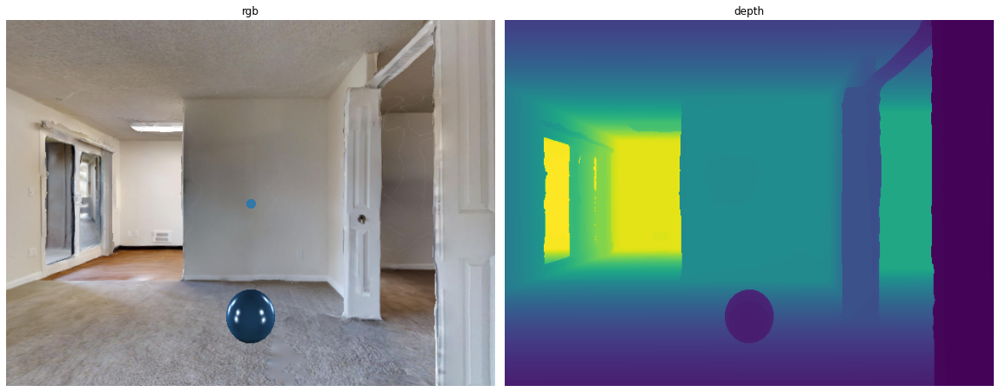

25 data/ycb/058_golf_ball.phys_properties.json
Vector(7.02231, 7.02231, 7.02231) 7.02231188759088 0.0427209734916687 0.3
058_golf_ball 0
(480, 640, 4)


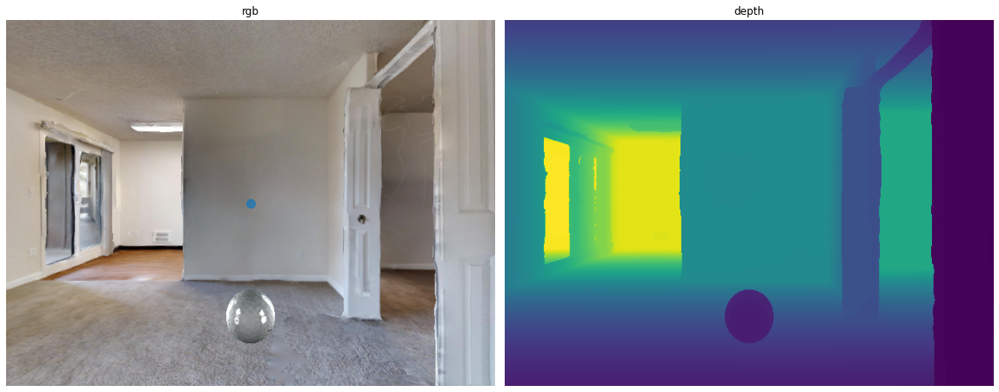

26 data/ycb/061_foam_brick.phys_properties.json
Vector(3.85238, 3.85238, 3.85238) 3.8523766770837398 0.07787400484085083 0.3
061_foam_brick 0
(480, 640, 4)


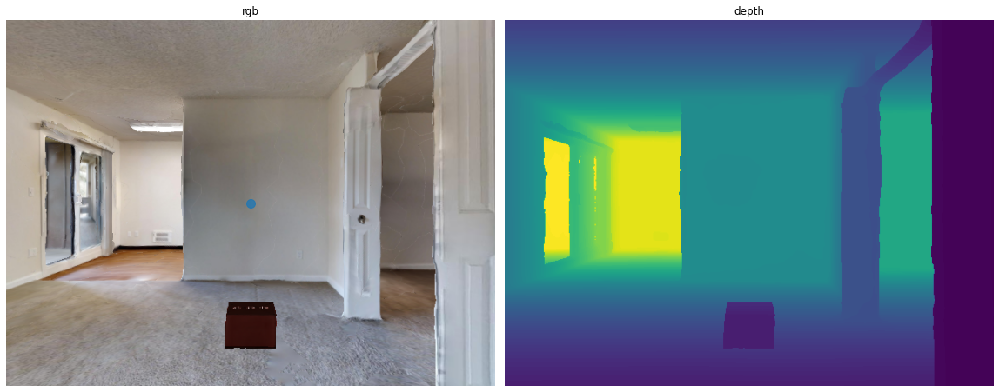

27 data/ycb/062_dice.phys_properties.json
Vector(17.4845, 17.4845, 17.4845) 17.4845232470889 0.017158031463623047 0.3
062_dice 0
(480, 640, 4)


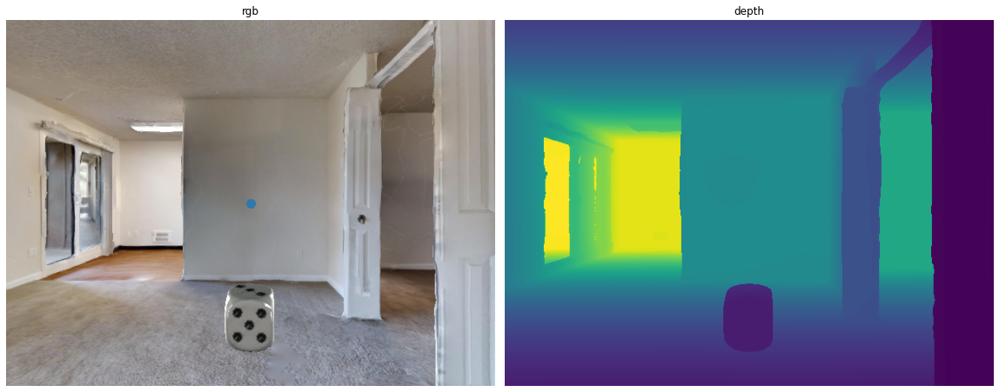

28 data/ycb/063-b_marbles.phys_properties.json
Vector(8.56361, 8.56361, 8.56361) 8.563605273769479 0.03503197431564331 0.3
063-b_marbles 0
(480, 640, 4)


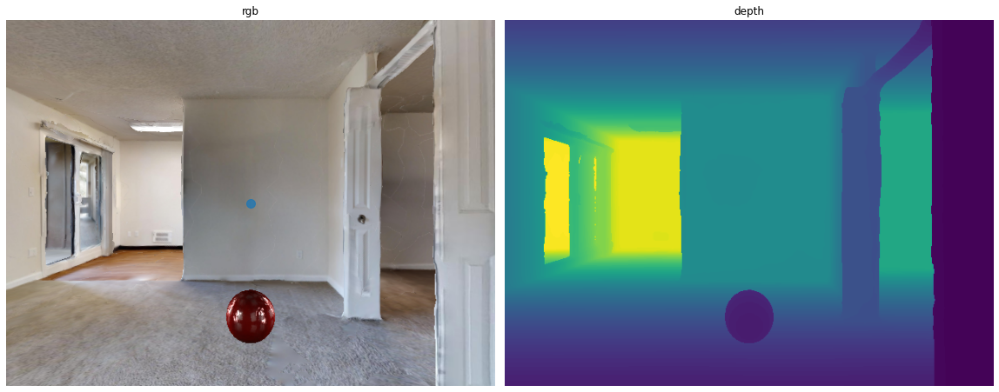

29 data/ycb/065-a_cups.phys_properties.json
Vector(5.2242, 5.2242, 5.2242) 5.224203472585507 0.05742502212524414 0.3
065-a_cups 0
(480, 640, 4)


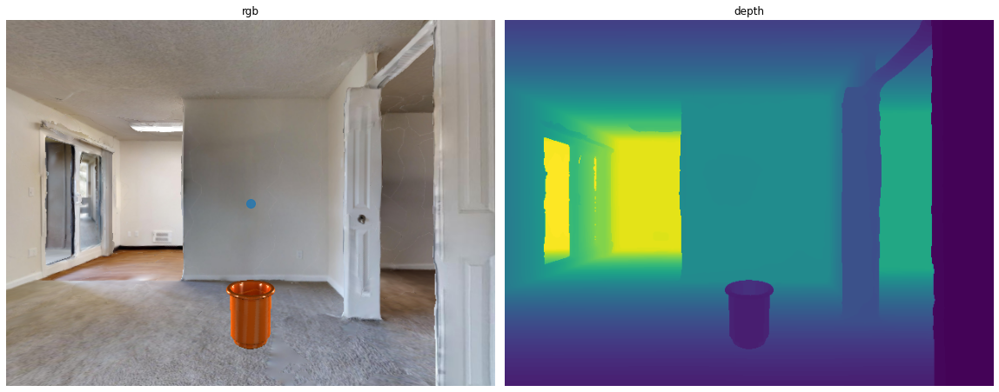

30 data/ycb/065-b_cups.phys_properties.json
Vector(4.92135, 4.92135, 4.92135) 4.921351689612015 0.0609588623046875 0.3
065-b_cups 0
(480, 640, 4)


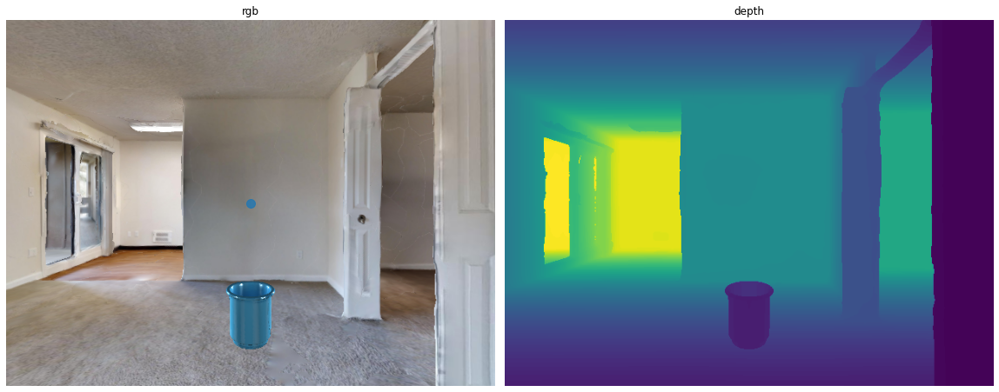

31 data/ycb/065-c_cups.phys_properties.json
Vector(4.60808, 4.60808, 4.60808) 4.60808297024391 0.06510299444198608 0.3
065-c_cups 0
(480, 640, 4)


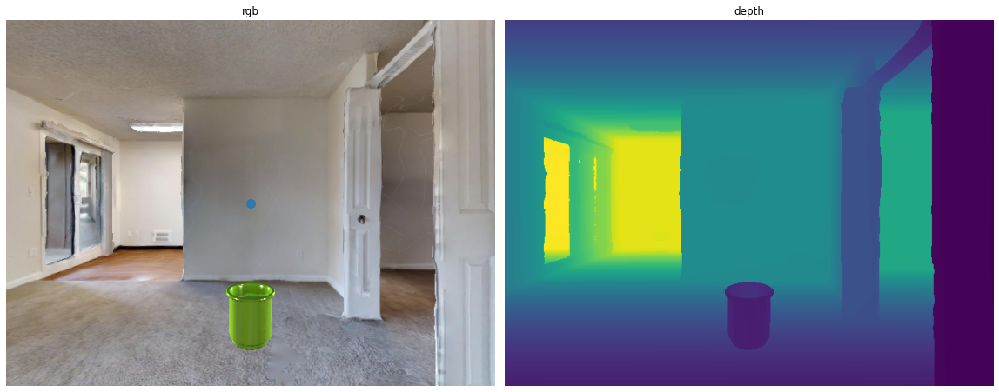

32 data/ycb/065-d_cups.phys_properties.json
Vector(4.2431, 4.2431, 4.2431) 4.243103222983664 0.07070297002792358 0.3
065-d_cups 0
(480, 640, 4)


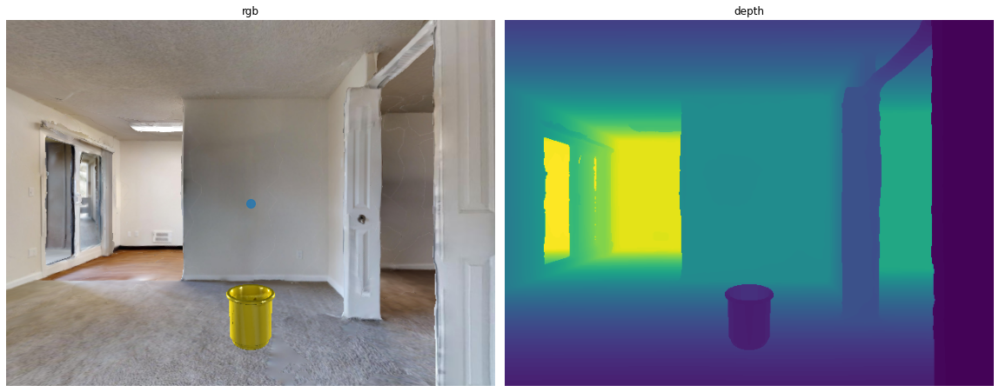

33 data/ycb/065-e_cups.phys_properties.json
Vector(3.97125, 3.97125, 3.97125) 3.9712520119930566 0.07554292678833008 0.3
065-e_cups 0
(480, 640, 4)


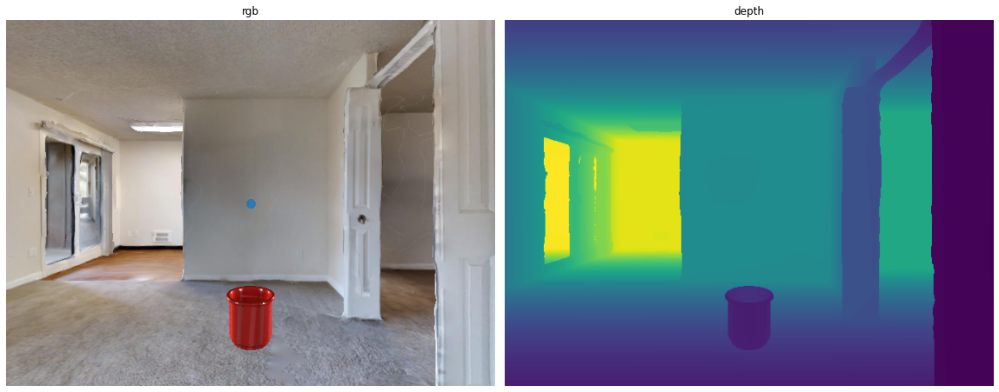

34 data/ycb/065-f_cups.phys_properties.json
Vector(3.70957, 3.70957, 3.70957) 3.7095657672756697 0.08087199926376343 0.3
065-f_cups 0
(480, 640, 4)


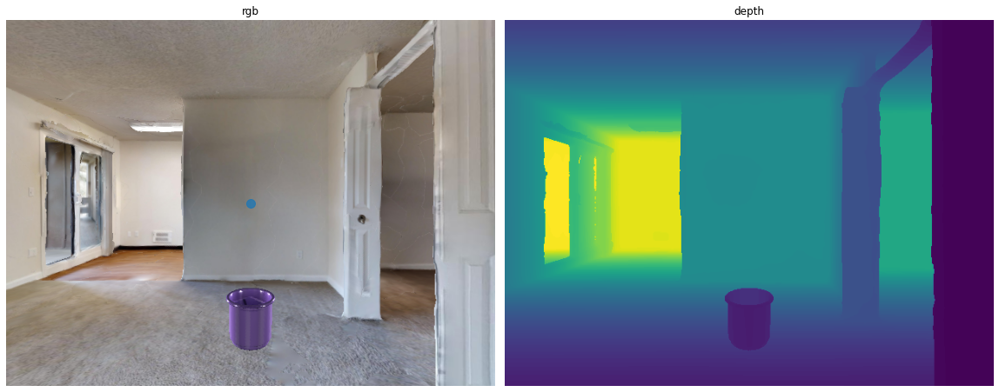

35 data/ycb/065-g_cups.phys_properties.json
Vector(3.42188, 3.42188, 3.42188) 3.4218847964646892 0.08767098188400269 0.3
065-g_cups 0
(480, 640, 4)


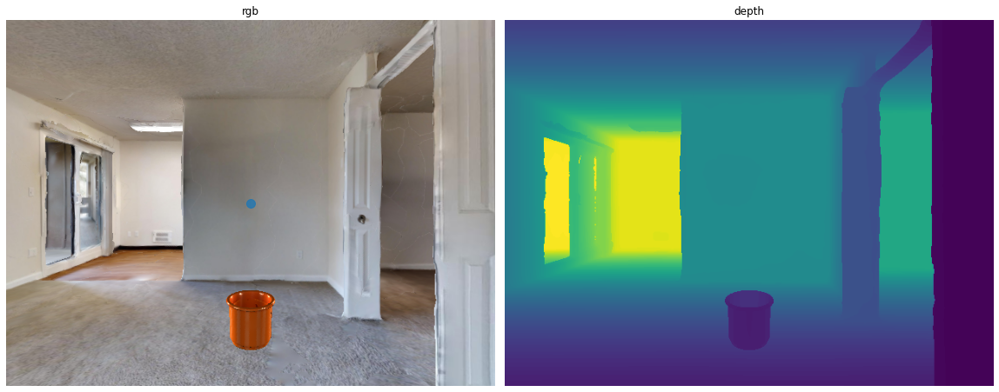

36 data/ycb/065-h_cups.phys_properties.json
Vector(3.27454, 3.27454, 3.27454) 3.274538095755471 0.09161597490310669 0.3
065-h_cups 0
(480, 640, 4)


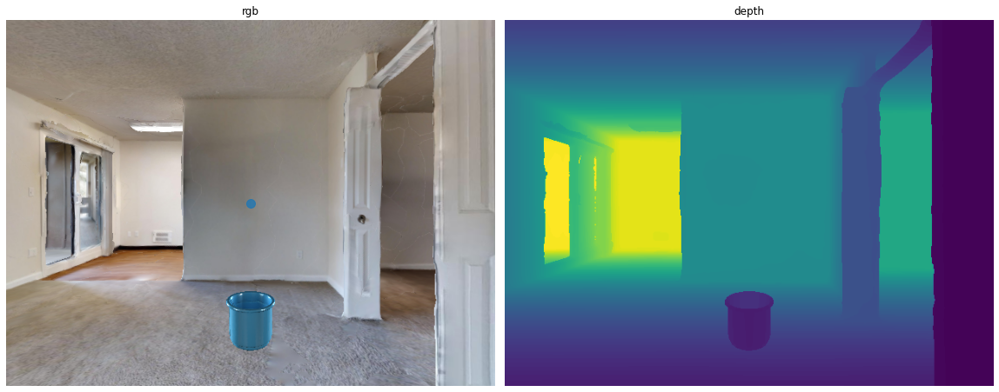

37 data/ycb/065-i_cups.phys_properties.json
Vector(3.05599, 3.05599, 3.05599) 3.0559888863522655 0.09816789627075195 0.3
065-i_cups 0
(480, 640, 4)


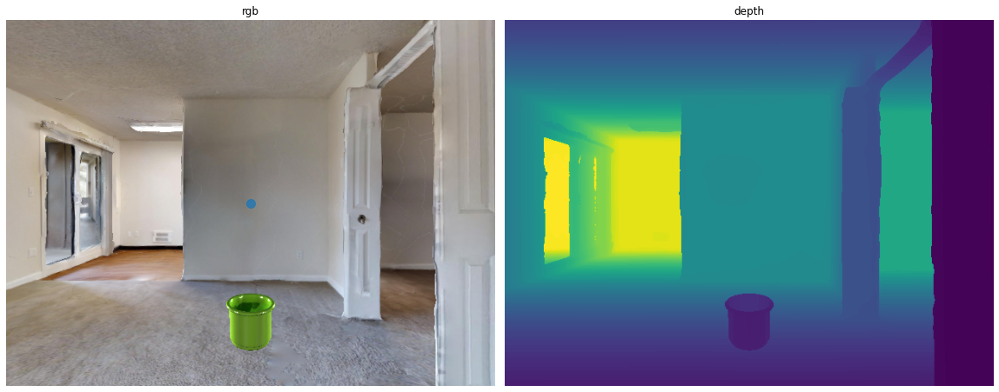

38 data/ycb/065-j_cups.phys_properties.json
Vector(2.91276, 2.91276, 2.91276) 2.912763365546488 0.10299497842788696 0.3
065-j_cups 0
(480, 640, 4)


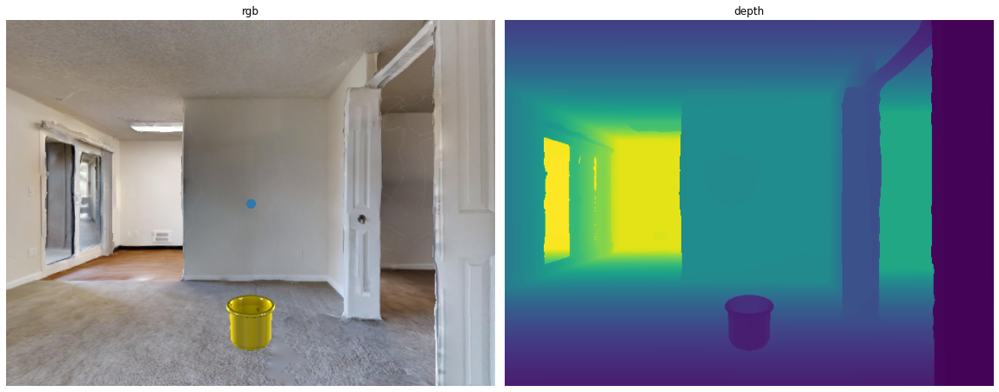

39 data/ycb/070-a_colored_wood_blocks.phys_properties.json
Vector(2.11123, 2.11123, 2.11123) 2.111233930315202 0.14209699630737305 0.3
070-a_colored_wood_blocks 0
(480, 640, 4)


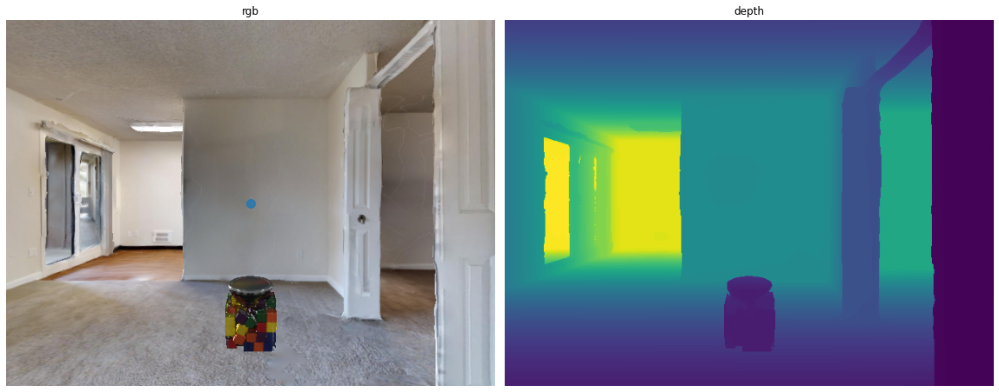

40 data/ycb/070-b_colored_wood_blocks.phys_properties.json
Vector(8.58811, 8.58811, 8.58811) 8.588109790431728 0.03493201732635498 0.3
070-b_colored_wood_blocks 0
(480, 640, 4)


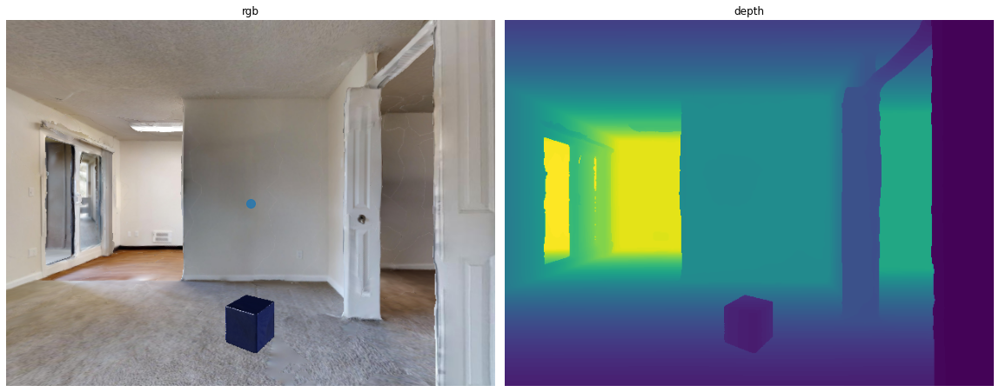

41 data/ycb/071_nine_hole_peg_test.phys_properties.json
Vector(1.56976, 1.56976, 1.56976) 1.569760289577451 0.1911119818687439 0.3
071_nine_hole_peg_test 0
(480, 640, 4)


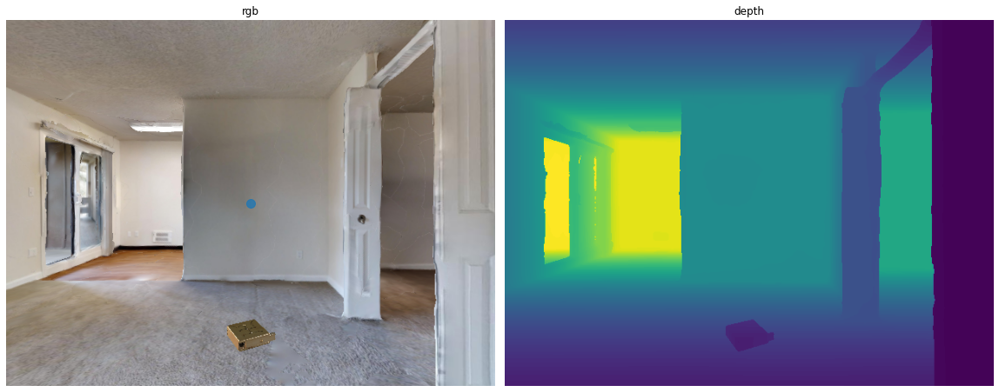

42 data/ycb/072-a_toy_airplane.phys_properties.json
Vector(1.14098, 1.14098, 1.14098) 1.1409794056900204 0.2629320025444031 0.3
072-a_toy_airplane 0
(480, 640, 4)


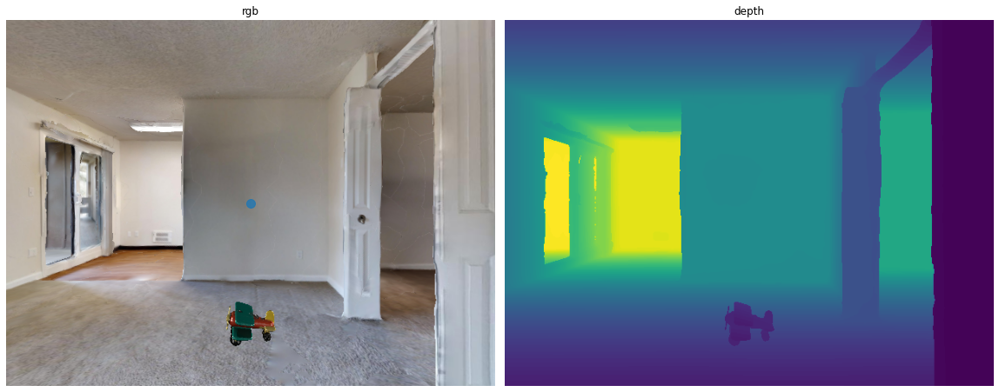

43 data/ycb/072-c_toy_airplane.phys_properties.json
Vector(9.78758, 9.78758, 9.78758) 9.787579340385811 0.030651092529296875 0.3
072-c_toy_airplane 0
(480, 640, 4)


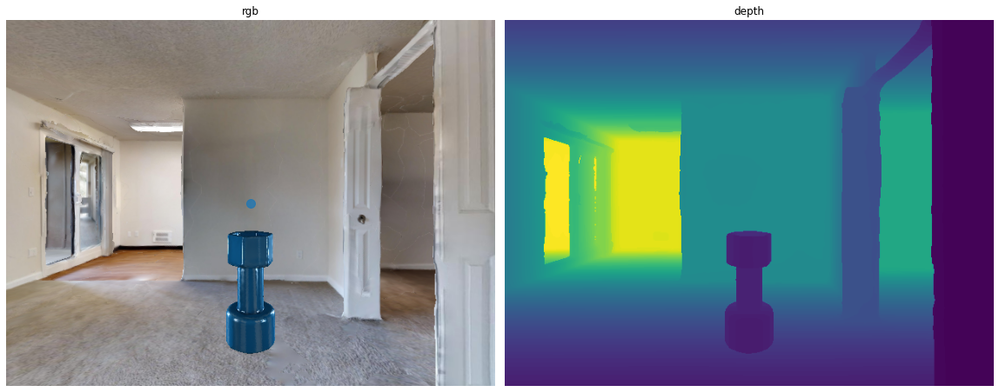

44 data/ycb/073-b_lego_duplo.phys_properties.json
Vector(8.1327, 8.1327, 8.1327) 8.132699069286453 0.03688812255859375 0.3
073-b_lego_duplo 0
(480, 640, 4)


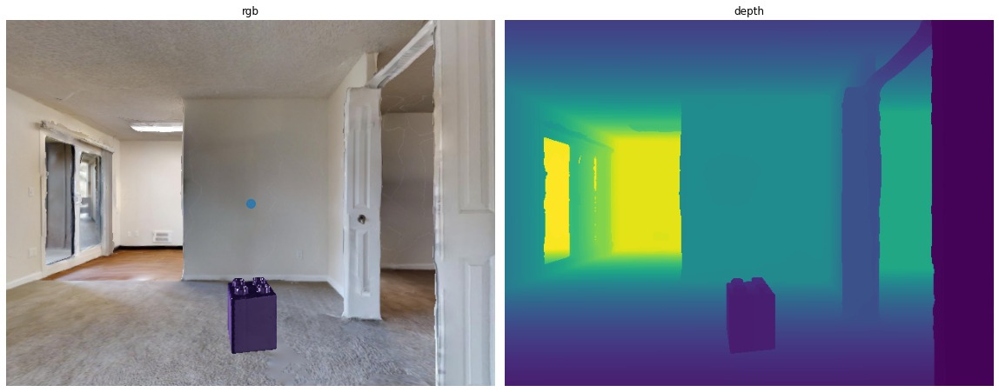

45 data/ycb/073-f_lego_duplo.phys_properties.json
Vector(8.17796, 8.17796, 8.17796) 8.1779574461171 0.03668397665023804 0.3
073-f_lego_duplo 0
(480, 640, 4)


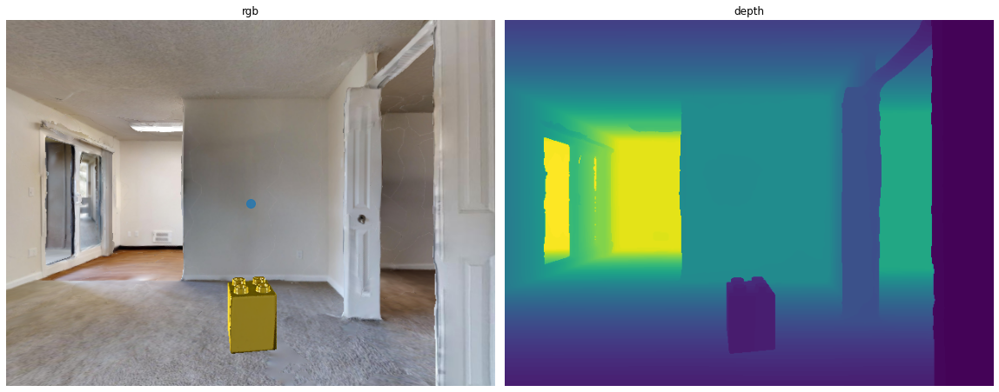

46 data/ycb/077_rubiks_cube.phys_properties.json
Vector(3.9413, 3.9413, 3.9413) 3.941301973092274 0.07611697912216187 0.3
077_rubiks_cube 0
(480, 640, 4)


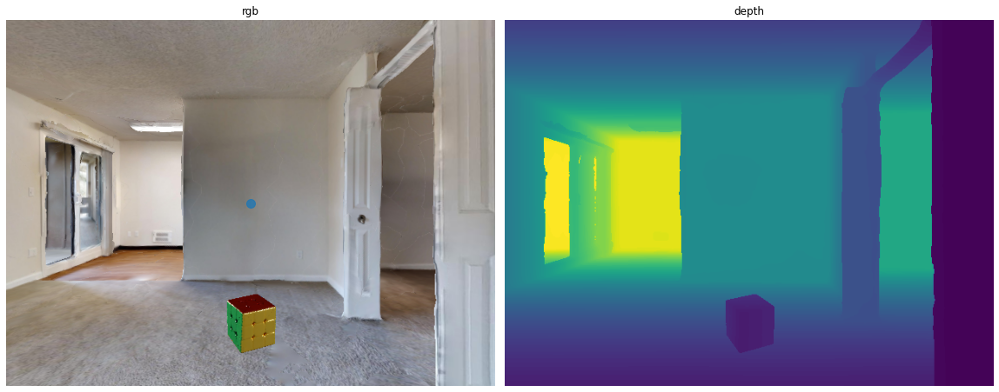

In [10]:
with habitat_sim.Simulator(cfg) as sim:
    init_agent(sim)

    # Manager of Object Attributes Templates
    obj_attr_mgr = sim.get_object_template_manager()
    handles = obj_attr_mgr.get_file_template_handles()
    object_templates = {}
    selected_handles = [0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 12, 13, 14, 15, 16, 17, 19, 20, 30, 41, 42, 43, 44, 45, 46, 48, 49, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 67, 71, 75, 77]
    for i, idx in enumerate(selected_handles):
        sel_file_obj_handle = handles[idx]
        print(i, sel_file_obj_handle)
        template_name, template_info = render_object(sim, sel_file_obj_handle, -1.5, 0)
        object_templates[template_name] = template_info

In [ ]:
with open('data/ycb_object_templates.json', 'w') as f:
    json.dump(object_templates, f)